# Visualisation des données des chaines de télévision TF1, FRANCE2 et FRANCE3

Les données sont issues du dossier nommé `televsion-news-analyser` qui ont été concaténées dans un **fichier CSV** grâce à un script de pré-processing.

## Analyse exploratoire des données

- Récupération du le fichier **CSV déjà traité** des données dans un **dataframe Pandas**

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("D:\__dossier_essais\DataForGood\data\df_3medias.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172714 entries, 0 to 172713
Data columns (total 15 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   title                      172706 non-null  object
 1   description                172361 non-null  object
 2   date                       172714 non-null  object
 3   order                      172714 non-null  int64 
 4   presenter                  135755 non-null  object
 5   authors                    172714 non-null  object
 6   editor                     114040 non-null  object
 7   editorDeputy               172714 non-null  object
 8   url                        172714 non-null  object
 9   urlTvNews                  172714 non-null  object
 10  containsWordGlobalWarming  172714 non-null  bool  
 11  media                      172714 non-null  object
 12  year                       172714 non-null  int64 
 13  month                      172714 non-null  

- Analyse **statistique** et **graphique** des **données manquantes**

In [4]:
print("Calcul de pourcentage de données manquantes par colonne :")
(df.isna().sum()/df.shape[0]*100).round(2)

Calcul de pourcentage de données manquantes par colonne :


title                         0.00
description                   0.20
date                          0.00
order                         0.00
presenter                    21.40
authors                       0.00
editor                       33.97
editorDeputy                  0.00
url                           0.00
urlTvNews                     0.00
containsWordGlobalWarming     0.00
media                         0.00
year                          0.00
month                         0.00
day                           0.00
dtype: float64

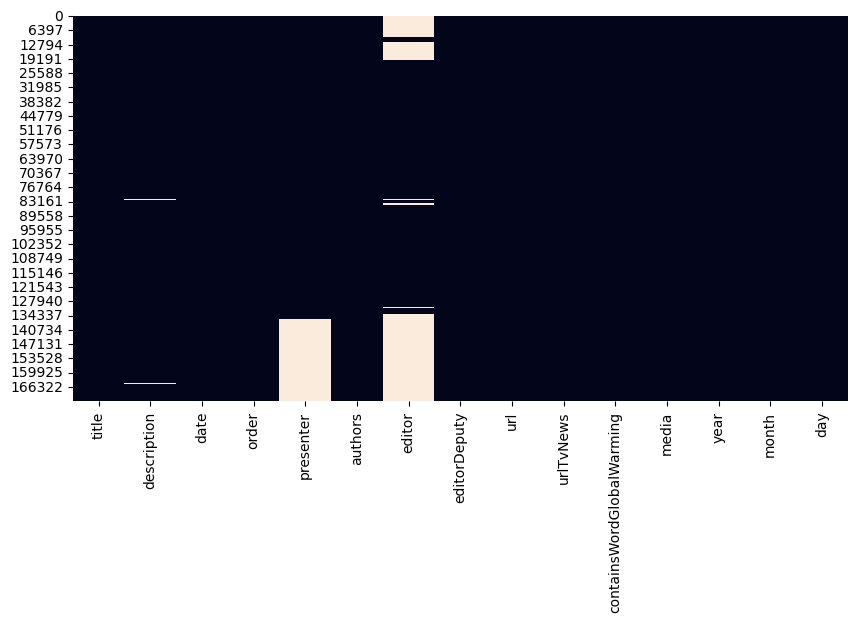

In [5]:
plt.figure(figsize=(10, 5))
sns.heatmap(df.isna(), cbar=False)
plt.show()

## Nettoyage des données

- Sélection des **colonnes utiles** pour l'analyse : **"title", "description", "date" et "media"**

In [6]:
interesting_columns = [
    "description", "date", "media",
]
df_small = df[interesting_columns]
df_small

,description,date,media
0,Coup de chapeau à Armel Le Cléac'h. Il avait é...,2013-10-01 00:00:00+00:00,France 2
1,La suite de notre feuilleton maintenant. Nous ...,2013-10-01 00:00:00+00:00,France 2
2,"Après les avis d'imposition, les contribuables...",2013-10-01 00:00:00+00:00,France 2
3,A suivre dans ce journal. Le ministère de la S...,2013-10-01 00:00:00+00:00,France 2
4,C'est un chef 3 étoiles qui aime la cuisine et...,2013-10-01 00:00:00+00:00,France 2
...,...,...,...
172709,"À Roubaix (Nord), les perruches à collier se c...",2022-09-09 10:20:00+00:00,TF1
172710,"Le bois et les granulés, actuellement l'énergi...",2022-09-09 12:25:00+00:00,TF1
172711,Le monde entier réagit au décès d'Elizabeth II...,2022-09-09 15:36:00+00:00,TF1
172712,La reine Elizabeth II était soucieuse de son i...,2022-09-09 20:40:00+00:00,TF1


- **Transformation** de la colonne **"date"** en type **"datetime"** pour faciliter la suite de l'analyse

In [7]:
df_small["date"] = pd.to_datetime(df_small["date"])
df_small.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172714 entries, 0 to 172713
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype              
---  ------       --------------   -----              
 0   description  172361 non-null  object             
 1   date         172714 non-null  datetime64[ns, UTC]
 2   media        172714 non-null  object             
dtypes: datetime64[ns, UTC](1), object(2)
memory usage: 4.0+ MB


C:\Users\PLB\AppData\Local\Temp\ipykernel_16132\1997281886.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small["date"] = pd.to_datetime(df_small["date"])


- Analyse des **données manquantes restantes**

In [8]:
df_small.isna().sum()

description    353
date             0
media            0
dtype: int64

- **Suppression des valeurs manquantes** pour la variable **"description"**

In [9]:
df_small = df_small.dropna(subset=['description'])
df_small.isna().sum()

description    0
date           0
media          0
dtype: int64

## 📚 Analyse du texte (NLP)

### 📈 Partie 1 : trouver toutes les émissions où le mot "COP" (ou ses dérivés) apparait dans la variable "description", récupérer le numéro de la COP et créer une visualisation de la donnée

Pour cela, on utilise la classe **`CountVectorizer`** de `Scikit-Learn` pour **tokeniser** et **vectoriser** les **descriptions**.

- Instanciation du **tokeniseur**

In [10]:
import difflib
from sklearn.feature_extraction.text import CountVectorizer

In [11]:
vectorizer = CountVectorizer()

- **Transformation** des données de description par le **tokeniseur**

In [12]:
X = vectorizer.fit_transform(df_small["description"])

- Remplacement de la **colonne "description"** par la **colonne "cop"** qui stocke les lignes où le mot **"cop" suivi d'un numéro entre 21 et 27** apparaît dans la description

In [13]:
cops = pd.DataFrame(columns=["date", "media", "cop"])
for nb_cop in range(21, 28):
    temp_df = df_small[["date", "media"]].iloc[X[:,vectorizer.vocabulary_[f"cop{nb_cop}"]].nonzero()[0]]
    temp_df["cop"] = nb_cop
    cops = pd.concat([cops, temp_df])
cops = cops.reset_index(drop=True)
cops

,date,media,cop
0,2015-10-15 00:00:00+00:00,France 2,21
1,2015-10-15 00:00:00+00:00,France 2,21
2,2015-10-19 00:00:00+00:00,France 2,21
3,2015-10-22 00:00:00+00:00,France 2,21
4,2015-10-31 00:00:00+00:00,France 2,21
...,...,...,...
235,2022-10-13 00:00:00+00:00,France 3,27
236,2022-11-15 00:00:00+00:00,France 3,27
237,2022-11-05 20:11:00+00:00,TF1,27
238,2022-11-06 23:12:00+00:00,TF1,27


- Vérification dans le **vocabulaire** les mots **proches de "cop21** : sélection des **20 mots les plus proches de cop21**

In [14]:
n_words = 20
selected_word = "cop21"
print(f"Liste des {n_words} mots les plus proches du mot {selected_word} : ")
for word in difflib.get_close_matches(selected_word, vectorizer.get_feature_names_out(), n_words):
    print(word)

Liste des 20 mots les plus proches du mot cop21 : 
cop21
co21
cop27
cop26
cop25
cop24
cop23
cop22
cap21
cop
co2
scop
crop
cov2
coup
corp
copé
copè
cops
cope


- **Vérification** si les mots **"co21", "cap21" et "cop"** ont un rapport avec la COP

In [15]:
df_small.iloc[X[:,vectorizer.vocabulary_["co21"]].nonzero()[0]].iloc[0,0]

'Depuis les débuts de l\'ère industrielle en 1880, la teneur en CO21 de l\'atmosphère a augmenté de 40%. France 3 fait le point.21 jours avant la COP21, les ministres d\'une soixantaine de pays sont actuellement à Paris pour trouver un compromis en vue d\'un accord. France 3 fait le point. Alors que les ministres d\'une soixantaine de pays se réunissent à Paris pour préparer la COP21, les émissions de gaz à effet de serre n\'ont jamais été aussi fortes. Le journaliste Jean-Christophe Batteria fait le point. "Depuis le début de l\'ère industrielle, depuis 1880, la teneur de l\'atmosphère en CO2 a augmenté de 40%. Quant au méthane, le CH4, là c\'est 150% de plus, en cause notamment l\'élevage intensif et ces deux gaz sont bien sur des gaz à effet de serre", explique le journaliste. Record annuel Le phénomène s\'accélère. "Les deux courbes publiées aujourd\'hui montrent que pour le CO2, les records annuels sont battus chaque année, et ce depuis 30 ans. 2014 ne fait pas exception, le rythm

> **Faute de frappe** : utilisation de "co21" **à la place de "co2"**

In [16]:
df_small.iloc[X[:,vectorizer.vocabulary_["cap21"]].nonzero()[0]].iloc[0,0]

'Près de Marseille, dans les Bouches-du-Rhône, une association propose des formations à la vie professionnelle, mais aussi des ateliers pour former à l\'autonomie les personnes atteintes de la trisomie 21.Dans un jardin situé à Niolon (Bouches-du-Rhône) viennent une fois par semaine trois jeunes atteints de la trisomie 21, afin de faire leurs premiers pas en permaculture. L’accompagnement se fait avec la plus grande bienveillance, de l’écoute et de la patience. Une parenthèse qui est la bienvenue pour ces jeunes en situation de handicap. "C’est trop bien, les rencontres, connaître de nouvelles personnes, j’adore ça", avoue Bruno. "Ça me change plutôt que de rester à la maison, ça me fait sortir", déclare Xavier. Faire des gestes en autonomie "Ce sont des jeunes qui pour la plupart avaient peur de mettre les mains dans la terre, avaient peur d’un insecte, et on les voit maintenant venir chaque semaine et faire des gestes en autonomie", assure Théo Amasse, chargé d\'animation pour "Grain

> Référence à l'**association CAP21** pas à la COP

In [17]:
df_small.iloc[X[:,vectorizer.vocabulary_["cop"]].nonzero()[0]].iloc[0,0]

'À Dunkerque (Nord), la chaleur d\'une usine est recyclée pour faire chauffer la ville. France 2 fait le point sur d\'autres initiatives vertes.La COP 21 va débuter dans une semaine. Dans la ville de Dunkerque (Nord), l\'énergie consommée par l\'usine Arcelor Mital est recyclée pour faire chauffer la ville. La journaliste de France 2? Julie Bekrrich fait le point sur d\'autres initiatives vertes. "Direction la piscine de Bailly-Romainvilliers (Seine et Marne) dont les quatre bassins sont chauffés par des ordinateurs. La chaleur générée par les serveurs d\'ordinateur d\'une baque située dans la zone commerciale d\'à côté qui fait que les baigneurs nagent dans une eau chaude", explique la journaliste. Pays nordiques Dans ce domaine, les pays nordiques sont précurseurs. "Là bas, il peut faire jusqu\'à - 30 degrés donc on peut imaginer que la question du chauffage soit un enjeu alors la ville a développé 65 km de tunnel qui récupèrent l\'énergie perdue par des usines des ordinateurs ou enc

> **Ajout d'espace** entre COP et le numéro donc ce cas est **à intégrer dans les descriptions sur la COP**

- Création à **nouveau du datframe** sur les **COP** mais cette fois avec les **COP numérotées et non numérotées**

In [18]:
cops = pd.DataFrame(columns=["date", "media", "description"])
list_cop = [f"cop{nb}" for nb in range(21, 28)]+["cop"]
for word in list_cop:
    temp_df = df_small[["date", "media", "description"]].iloc[X[:,vectorizer.vocabulary_[word]].nonzero()[0]]
    cops = pd.concat([cops, temp_df])
cops = cops.reset_index(drop=True)
cops

,date,media,description
0,2015-10-15 00:00:00+00:00,France 2,Pour limiter son usage et réduire la pollution...
1,2015-10-15 00:00:00+00:00,France 2,"À un mois et demi de la COP21, le pays est cit..."
2,2015-10-19 00:00:00+00:00,France 2,Une équipe de France 2 a suivi une équipe de c...
3,2015-10-22 00:00:00+00:00,France 2,"Le réalisateur, applaudi pour ""La Marche de l'..."
4,2015-10-31 00:00:00+00:00,France 2,Le chantier était suspendu depuis 2012. Les op...
...,...,...,...
338,2021-10-15 00:00:00+00:00,TF1,Buckingham est tenue au silence sur les questi...
339,2021-10-26 00:00:00+00:00,TF1,La reine d'Angleterre ne pourra pas participer...
340,2021-11-01 00:00:00+00:00,TF1,La COP26 s’est ouverte à Glasgow ce lundi. Son...
341,2021-11-17 00:00:00+00:00,TF1,"L'image peut paraître banale, mais elle a rass..."


- Visualisation graphique des données de l'apparition du **mot "cop"** dans la **description des programmes** des chaînes **TF1, FRANCE 2 et FRANCE 3**

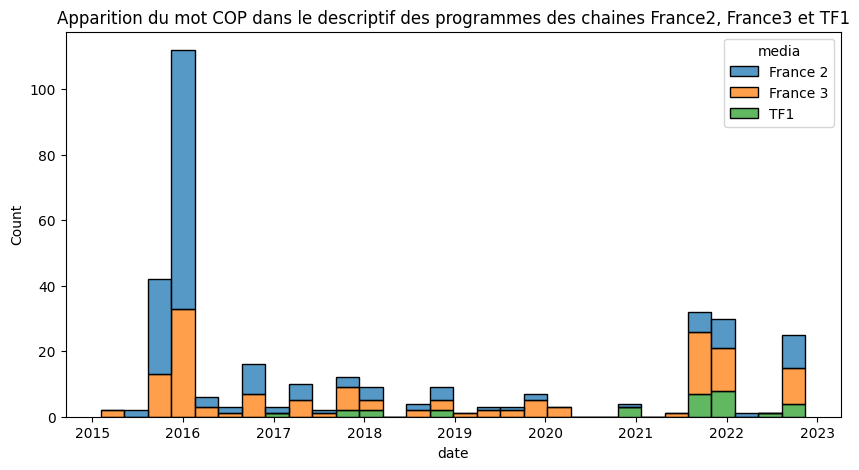

In [19]:
plt.figure(figsize=(10, 5))
plt.title("Apparition du mot COP dans le descriptif des programmes des chaines France2, France3 et TF1")
sns.histplot(data=cops, x="date", hue="media", bins=30, multiple="stack")
plt.show()

⚠️ Les données concernant TF1 ne débutent qu'en novembre 2016

### 📈 Partie 2 : création d'une visualisation de nuage de mots des mots les plus utilisés dans les descriptions des émissions par mois ou par semaine (animation)

L'objectif est de déterminer les **thématiques le plus traitées** par les 3 chaînes **TF1, FRANCE 2 et FRANCE 3** sur les plages de temps fixes (un mois ou une semaine). La **première étape** consiste à **nettoyer la donnée textuelle** de la description : utilisation d'un **sac de mots** pour **vectoriser** les descriptions et suppression du "bruit" par la **suppression des stopwords** et la **lemmatisation**.



In [20]:
import spacy
from wordcloud import WordCloud, get_single_color_func
import matplotlib.image as mpimg

- Passage de la **colonne "date"** en **index**

In [21]:
df_small = df_small.set_index("date")
df_small.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 172361 entries, 2013-10-01 00:00:00+00:00 to 2022-09-09 20:44:00+00:00
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   description  172361 non-null  object
 1   media        172361 non-null  object
dtypes: object(2)
memory usage: 3.9+ MB


- **Ajout d'une colonne** au dataframe pour le texte **lemmatisé en français** avec spacy

> ⚠️ La **lemmatisation** prend **beaucoup de temp**s. Un **fichier CSV** est créé pour **conserver ces données**

In [22]:
nlp = spacy.load('fr_core_news_lg')

In [37]:
df_small["spacy"] = df_small.iloc[:, 0].apply(lambda doc: " ".join([token.lemma_ for token in nlp(doc)]))
df_small

,description,media,spacy
date,,,
2013-10-01 00:00:00+00:00,Coup de chapeau à Armel Le Cléac'h. Il avait é...,France 2,coup de chapeau à Armel le Cléac' h. il avoir ...
2013-10-01 00:00:00+00:00,La suite de notre feuilleton maintenant. Nous ...,France 2,le suite de notre feuilleton maintenant . nous...
2013-10-01 00:00:00+00:00,"Après les avis d'imposition, les contribuables...",France 2,"après le avis de imposition , le contribuable ..."
2013-10-01 00:00:00+00:00,A suivre dans ce journal. Le ministère de la S...,France 2,avoir suivre dans ce journal . le ministère de...
2013-10-01 00:00:00+00:00,C'est un chef 3 étoiles qui aime la cuisine et...,France 2,ce être un chef 3 étoile qui aime le cuisine e...
...,...,...,...
2022-09-09 10:20:00+00:00,"À Roubaix (Nord), les perruches à collier se c...",TF1,"à Roubaix ( Nord ) , le perruche à collier se ..."
2022-09-09 12:25:00+00:00,"Le bois et les granulés, actuellement l'énergi...",TF1,"le bois et le granulé , actuellement le énergi..."
2022-09-09 15:36:00+00:00,Le monde entier réagit au décès d'Elizabeth II...,TF1,le monde entier réagir au décès de Elizabeth i...


In [39]:
df_small.to_csv("df_small.csv")

- Récupération des **données lemmatisées**

In [23]:
df_small = pd.read_csv("df_small.csv", index_col="date", parse_dates=["date"])
df_small

,description,media,spacy
date,,,
2013-10-01 00:00:00+00:00,Coup de chapeau à Armel Le Cléac'h. Il avait é...,France 2,coup de chapeau à Armel le Cléac' h. il avoir ...
2013-10-01 00:00:00+00:00,La suite de notre feuilleton maintenant. Nous ...,France 2,le suite de notre feuilleton maintenant . nous...
2013-10-01 00:00:00+00:00,"Après les avis d'imposition, les contribuables...",France 2,"après le avis de imposition , le contribuable ..."
2013-10-01 00:00:00+00:00,A suivre dans ce journal. Le ministère de la S...,France 2,avoir suivre dans ce journal . le ministère de...
2013-10-01 00:00:00+00:00,C'est un chef 3 étoiles qui aime la cuisine et...,France 2,ce être un chef 3 étoile qui aime le cuisine e...
...,...,...,...
2022-09-09 10:20:00+00:00,"À Roubaix (Nord), les perruches à collier se c...",TF1,"à Roubaix ( Nord ) , le perruche à collier se ..."
2022-09-09 12:25:00+00:00,"Le bois et les granulés, actuellement l'énergi...",TF1,"le bois et le granulé , actuellement le énergi..."
2022-09-09 15:36:00+00:00,Le monde entier réagit au décès d'Elizabeth II...,TF1,le monde entier réagir au décès de Elizabeth i...


In [24]:
df_small.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 172361 entries, 2013-10-01 00:00:00+00:00 to 2022-09-09 20:44:00+00:00
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   description  172361 non-null  object
 1   media        172361 non-null  object
 2   spacy        172361 non-null  object
dtypes: object(3)
memory usage: 5.3+ MB


- Création de la **liste de stopwords**

In [25]:
stop_words = [
    'selon', 'lundi', 'vendredi', '03', 'téléviser', 'présenter', 'diffuser', '05', '06', '15', 'mercredi',
    'plusieurs', 'avant', '20', 'million', '09', '08', '13h', '01', '02', '07', "mardi", 'jeudi', "actualité",
    'mois', 'monde', 'personne', 'reportage', 'petit', '10', 'hier', 'oui', 'votre', 'tf1', 'journal', 'journaliste',
    '2020', '11', '12', '19', 'sans', 'puis', 'voilà', 'contre', 'chez', 'sous', 'jusque',
    'devoir', 'venir', 'suivre', '2017', '2016', 'ainsi', 'dire', 'prendre', 'explique', 'pourcent', 'déjà',
    'entre', 'abord', 'notamment', 'merci', 'également', 'fois', 'voici', 'voir', 'falloir', 'passer', 'vouloir',
    'heure', 'nouveau', '20h', 'jt', '2018', '2019', 'euro', 'premier', 'dernier', 'année', 'toujours', 'chaque',
    'quand', 'quelque', 'mon', 'peu', 'hui', 'là', 'notre', 'celui', 'moins', 'pouvoir', 'an',
    'me', 'très', 'français', 'de', 'la', 'le', 'les', 'des', 'en', 'est', 'et', 'pour', 'un', 'du',
   'une', 'sur', 'il', 'dans', 'qui', 'ce', 'plus', 'que', 'au','sont', 'pas', 'ont', 'se', 'par',
    'on', 'mais', 'ne',  'cette', 'qu', 'son', 'aux', 'avec', 'elle', 'ils', 'depuis', 'comme',
     'être', 'après', 'nous', 'ces', 'ses', 'sa', 'ou', 'tout', 'ici', 'même', 'encore', 'alors',
    'deux', 'trois', 'leur', 'fait', 'été', 'aussi', 'leurs', 'tous','000', 'était', 'sera', 'bien', 'va',
    'beaucoup', 'lors', 'près', 'si', 'vous', 'ça', 'donc', 'je', 'janvier', 'février', 'mars', 'avril', 'mai',
    'juin', 'juillet', 'août', 'septembre', 'octobre', 'novembre', 'décembre', 'bonsoir', 'france', "aujourd'hui", 'où',
    "sujet", 'grand', 'soir', 'direct', 'aujourd', 'autre', 'jour', 'aller', 'avoir', 'cela', 'faire', 'lui', 'à',
]

- Choix de la **couleur des mots**

In [26]:
class GroupedColorFunc():
    def __init__(self, color_to_words, default_color):
        self.color_func_to_words = [
            (get_single_color_func(color), set(words))
            for (color, words) in color_to_words.items()]

        self.default_color_func = get_single_color_func(default_color)

    def get_color_func(self, word):
        """Returns a single_color_func associated with the word"""
        try:
            color_func = next(
                color_func for (color_func, words) in self.color_func_to_words
                if word in words)
        except StopIteration:
            color_func = self.default_color_func

        return color_func

    def __call__(self, word, **kwargs):
        return self.get_color_func(word)(word, **kwargs)

In [27]:
color_to_words = {
    'red': [
        'eau', 'avion', 'vol', "aéroport",'inondation', 'incendie',
        'feu', 'pompier', 'ouragan', 'irma', 'crue',
        'chaleur', 'degré', 'flamme', 'sécheresse',
    ]
}
default_color = 'grey'
grouped_color_func = GroupedColorFunc(color_to_words, default_color)

- Instanciation du **vectoriseur (sac de mots)**

In [28]:
vect = CountVectorizer(stop_words=stop_words)

- **Transformation** des données lemmatisées par le **tokeniseur**. Création des **nuages de mots** par **chaine** et pour une **fréquence mensuelle**

> ⚠️ Les images des **logos des chaines** doivent être présentes dans le dossier du notebook

In [30]:
def wcloud(df):
    year, month, day = (str(df.index[0])[:10]).split("-")
    liste_mois = ["", "JANVIER", "FEVRIER", "MARS", "AVRIL", "MAI", "JUIN", "JUILLET", "AOUT", "SEPTEMBRE", "OCTOBRE", "NOVEMBRE", "DECEMBRE"]
    plt.rcParams.update({'font.size': 22})
    fig, axs = plt.subplots(3, 2)
    # Images des logos des chaines
    image_list = ["France_2_logo.png", "France_3_logo.png", "TF1_logo.png"]
    for i, media in enumerate(["France 2", "France 3", "TF1"]):
        df_media = df[df["media"]==media]
        if len(df_media)==0:
            continue
        cv_fit = vect.fit_transform(df_media["spacy"])
        result = pd.DataFrame(cv_fit.toarray(), columns=vect.get_feature_names_out()).sum().sort_values(ascending=False)[:30]
        wordcloud = WordCloud()
        wordcloud.generate_from_frequencies(frequencies=result)
        wordcloud.recolor(color_func=grouped_color_func)
        img = mpimg.imread(image_list[i])
        axs[i, 0].imshow(img)
        axs[i, 0].axis("off")
        axs[i, 1].imshow(wordcloud, interpolation="bilinear")
        axs[i, 1].axis("off")
    fig.suptitle(f"{liste_mois[int(month)]} {year}", fontsize=16)
    fig.savefig(f'D:\\__dossier_essais\\DataForGood\\images\\{str(df.index[0])[:10]}.png')

C:\Users\PLB\AppData\Local\Temp\ipykernel_16132\3068082580.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 2)


""


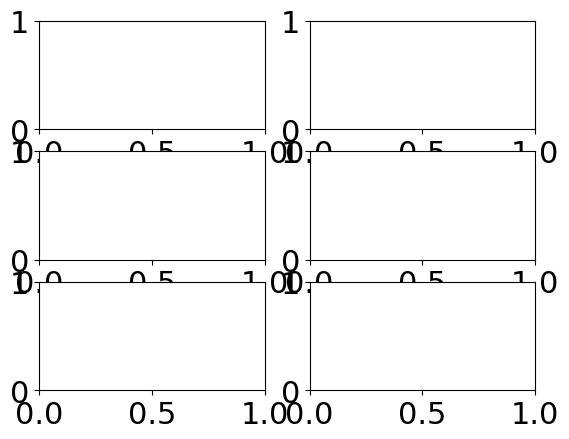

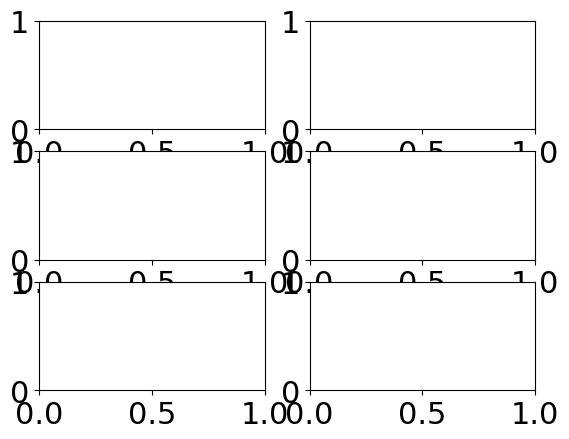

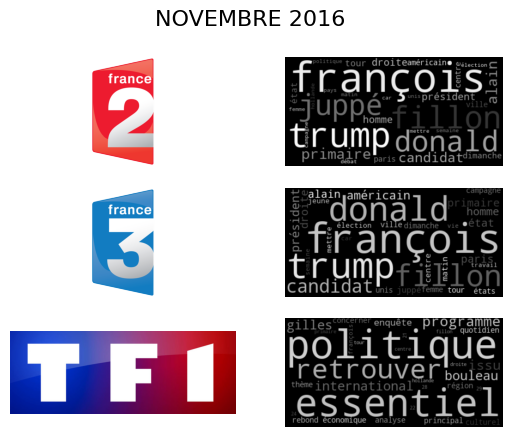

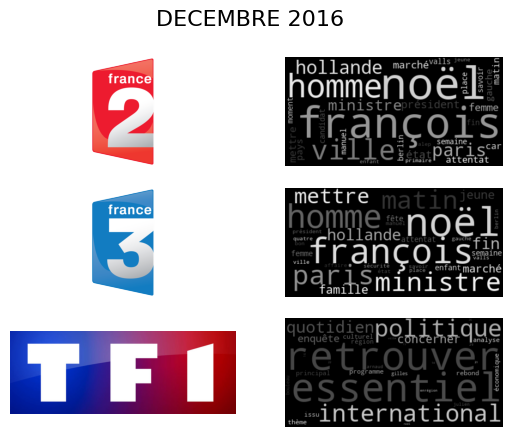

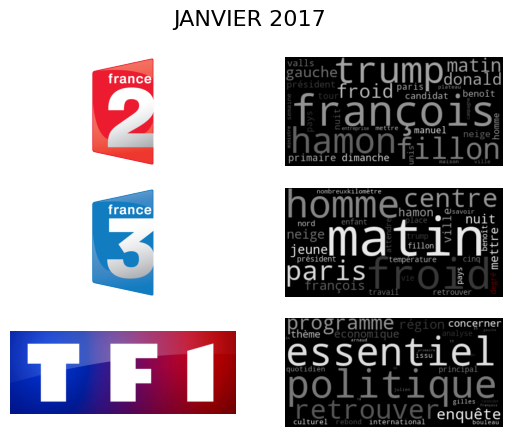

...

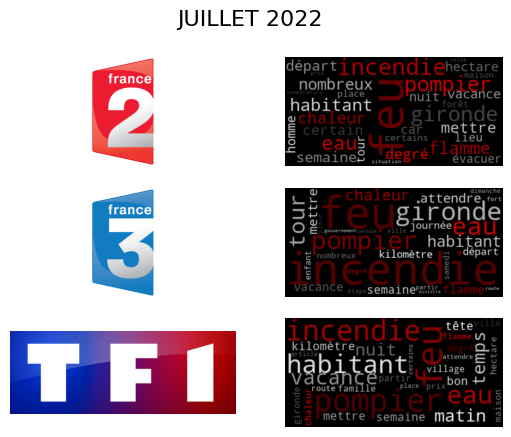

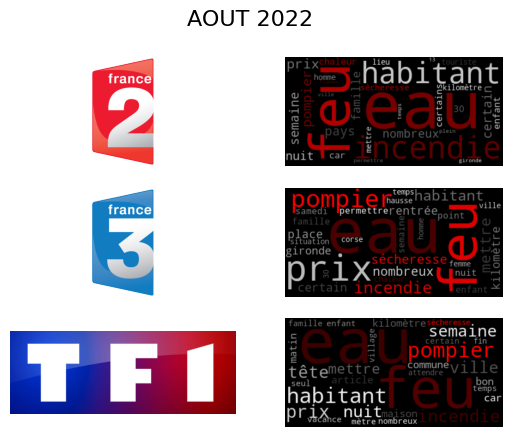

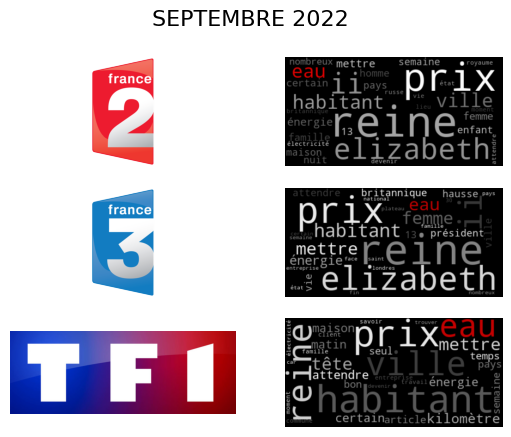

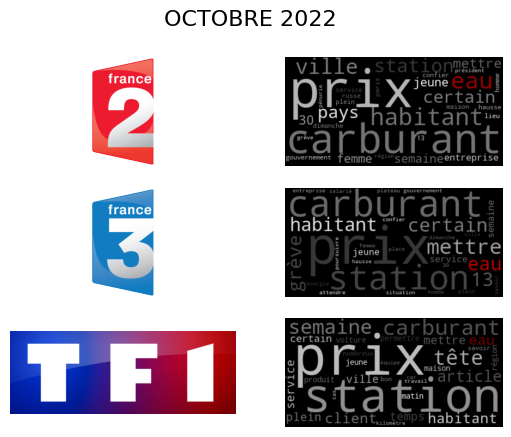

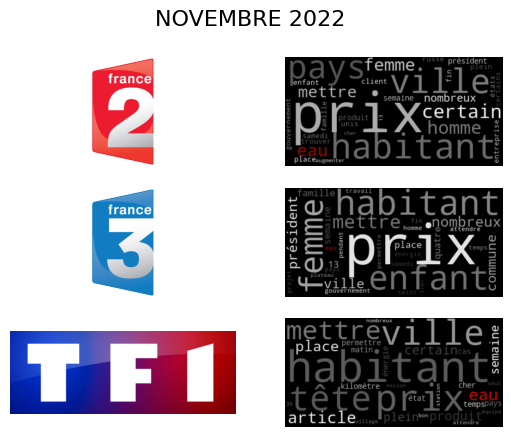

In [31]:
df_small.loc["2016-11":].resample('M').apply(wcloud)

- Création du **GIF**

In [32]:
import os
import imageio

png_dir = r'D:\__dossier_essais\DataForGood\images'
images = []
for file_name in sorted(os.listdir(png_dir)):
    if file_name.endswith('.png'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
    # Temps de pause entre chaque image
    for _ in range(5):
        images.append(imageio.imread(file_path))

imageio.mimsave(r'D:\__dossier_essais\DataForGood\images\movie.gif', images)

C:\Users\PLB\AppData\Local\Temp\ipykernel_16132\1029178888.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))
C:\Users\PLB\AppData\Local\Temp\ipykernel_16132\1029178888.py:12: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))
